In [1]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

In [3]:
# Define hyperparameters
num_epochs = 100
batch_size = 64
learning_rate = 0.0002
image_size = 28
image_channels = 1
latent_dim = 100

In [4]:
# Create a custom dataset for MNIST
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

mnist_dataset = datasets.MNIST(root='./data',
                               train=True,
                               transform=transform,
                               download=True)

data_loader = DataLoader(dataset=mnist_dataset,
                         batch_size=batch_size,
                         shuffle=True)

100%|██████████| 9.91M/9.91M [00:00<00:00, 20.6MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 501kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 4.63MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 11.2MB/s]


In [5]:
# Define the generator network
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 256, 7, 1, 0),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, image_channels, 4, 2, 1),
            nn.Tanh()
        )

    def forward(self, z):
        return self.model(z)

# Define the discriminator network
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(image_channels, 128, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, 7, 1, 0),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Initialize the generator and discriminator
generator = Generator().cuda().to(device)
discriminator = Discriminator().cuda().to(device)

In [13]:
# Define loss and optimizers
criterion = nn.BCELoss()
optimizer_g = torch.optim.Adam(generator.parameters(), lr=learning_rate)
optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=learning_rate)

Epoch: 1


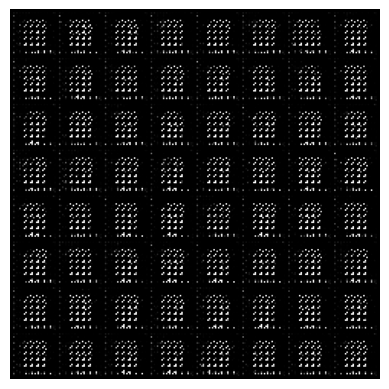

Epoch: 2


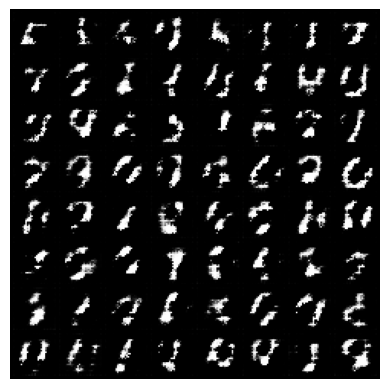

Epoch: 3


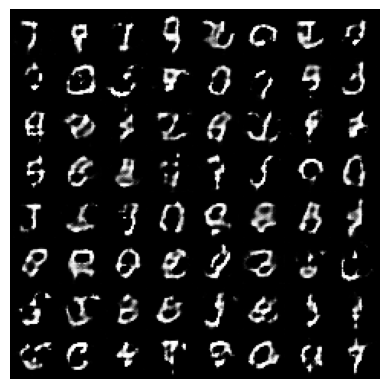

Epoch: 4


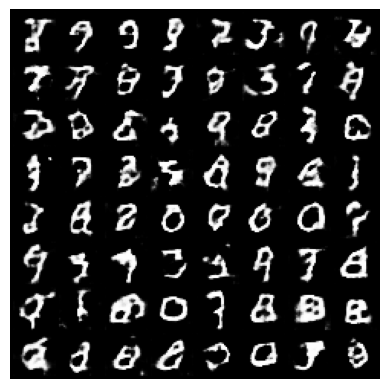

Epoch: 5


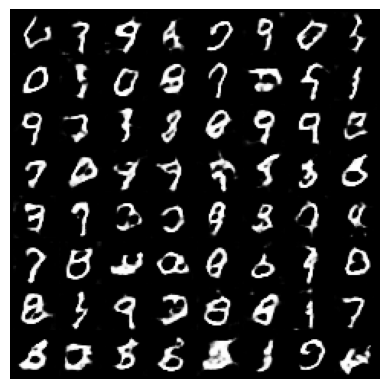

Epoch: 6


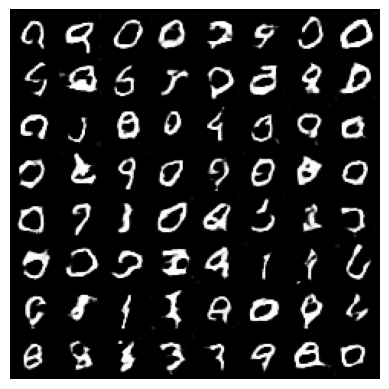

Epoch: 7


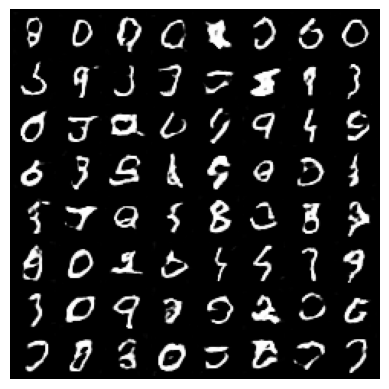

Epoch: 8


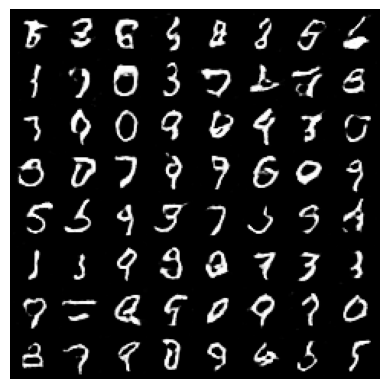

Epoch: 9


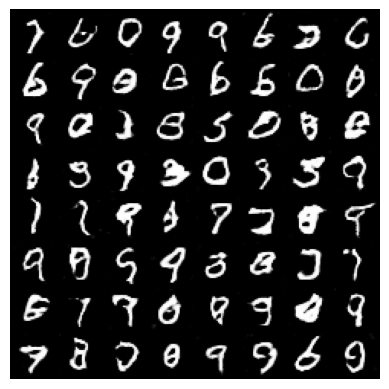

Epoch: 10


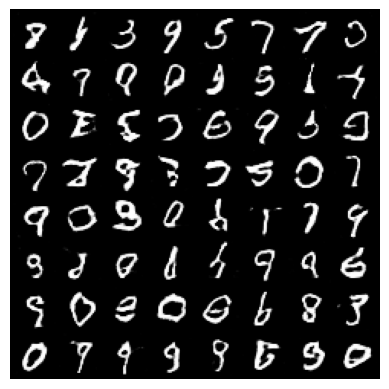

Epoch: 11


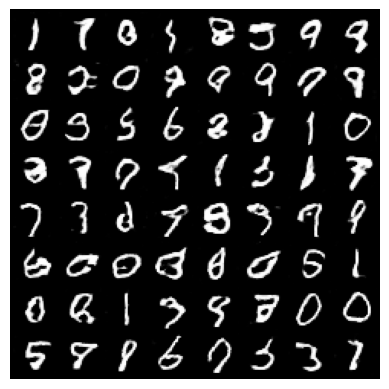

Epoch: 12


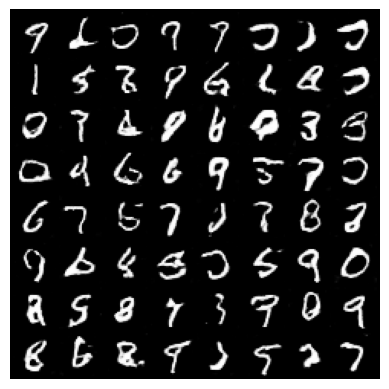

Epoch: 13


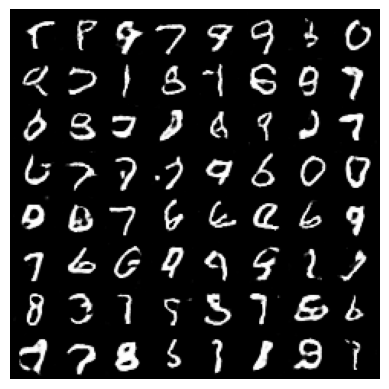

Epoch: 14


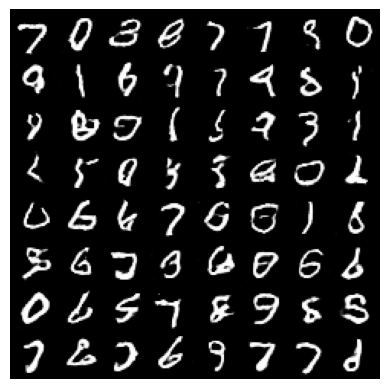

Epoch: 15


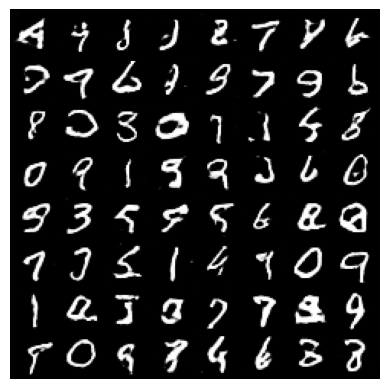

Epoch: 16


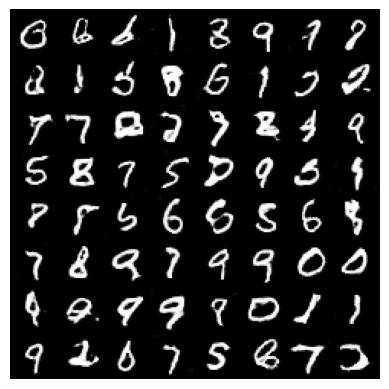

Epoch: 17


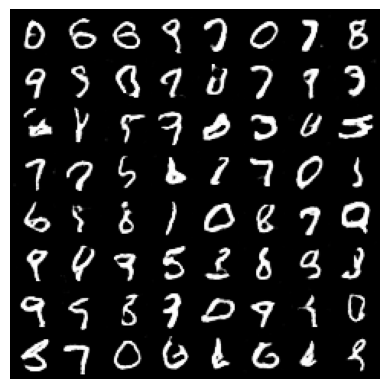

Epoch: 18


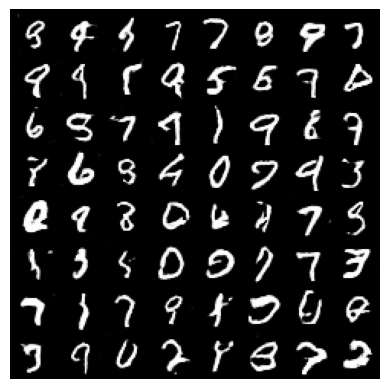

Epoch: 19


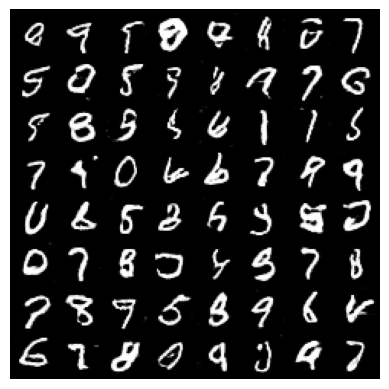

Epoch: 20


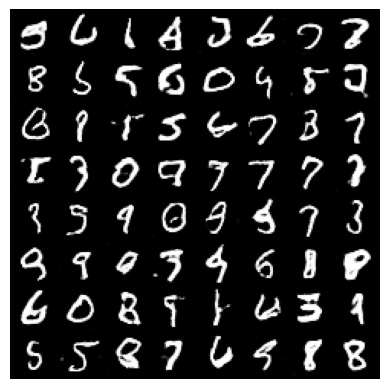

Epoch: 21


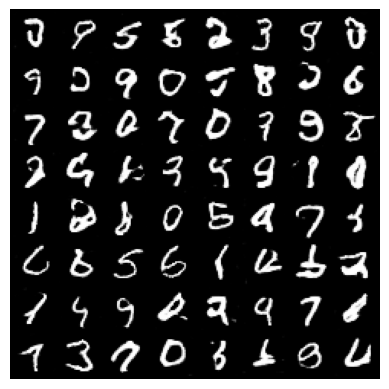

Epoch: 22


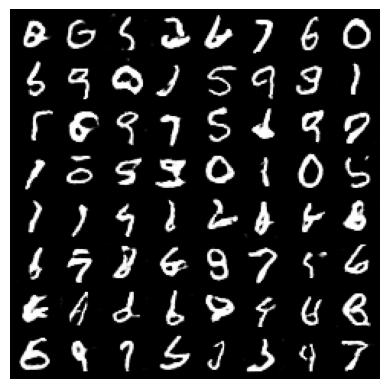

Epoch: 23


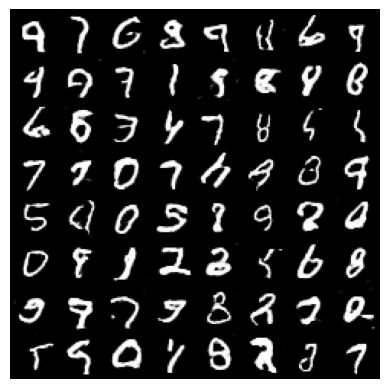

Epoch: 24


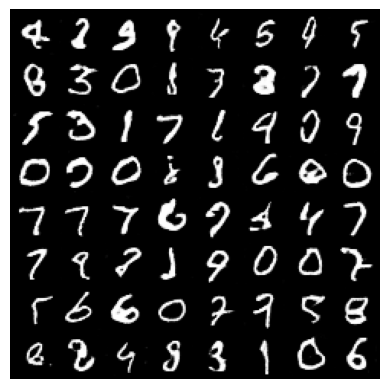

Epoch: 25


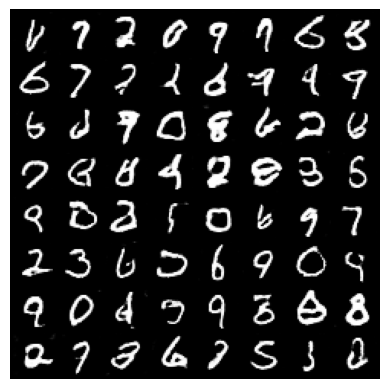

Epoch: 26


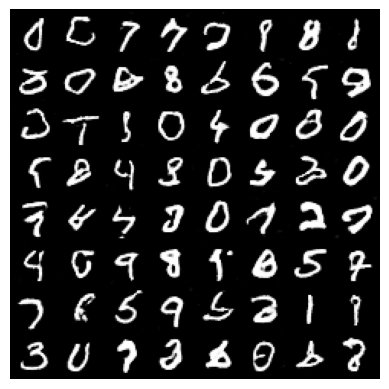

Epoch: 27


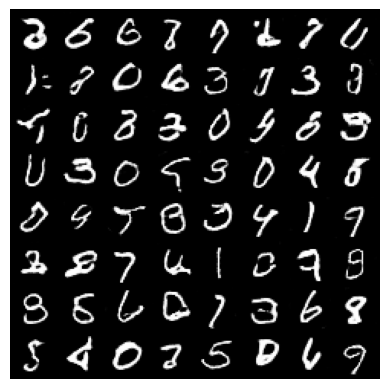

Epoch: 28


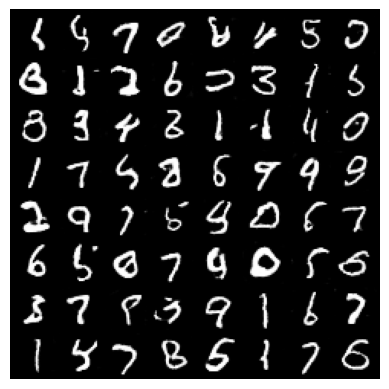

Epoch: 29


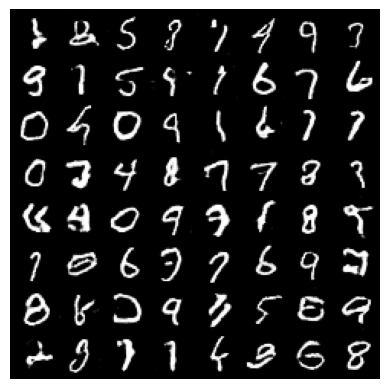

Epoch: 30


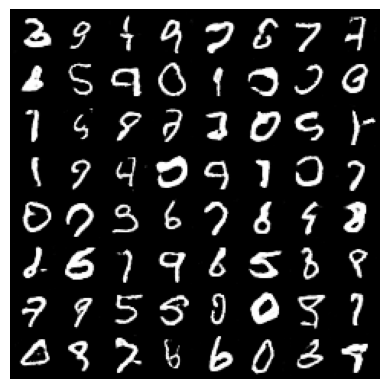

Epoch: 31


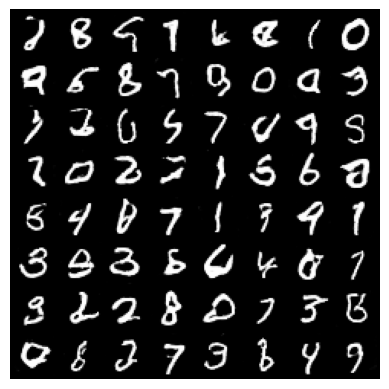

Epoch: 32


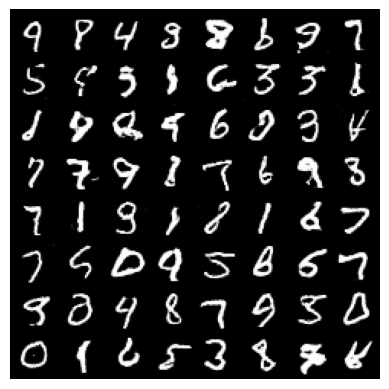

Epoch: 33


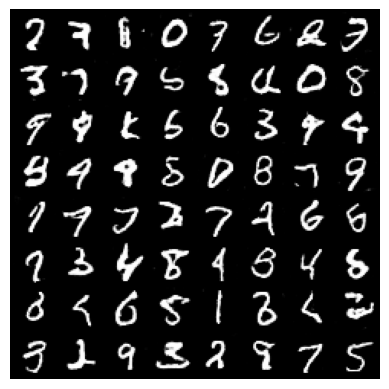

Epoch: 34


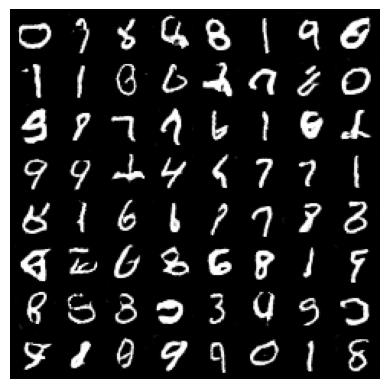

Epoch: 35


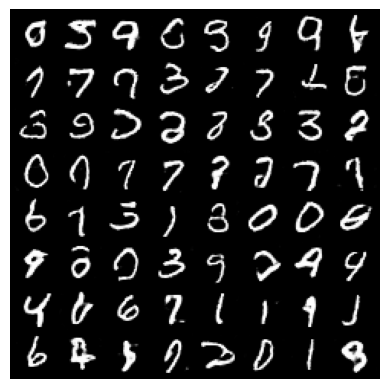

Epoch: 36


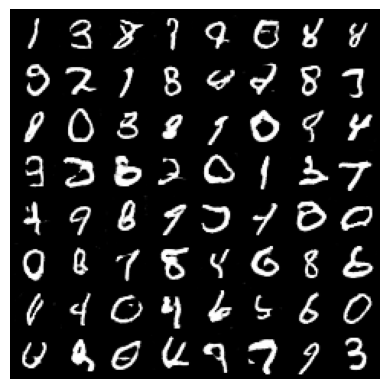

Epoch: 37


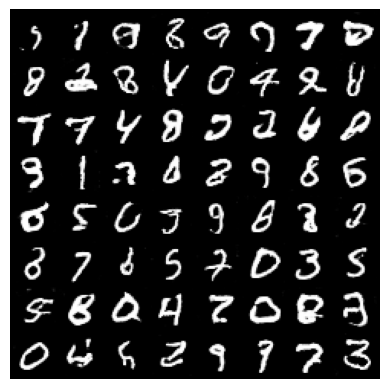

Epoch: 38


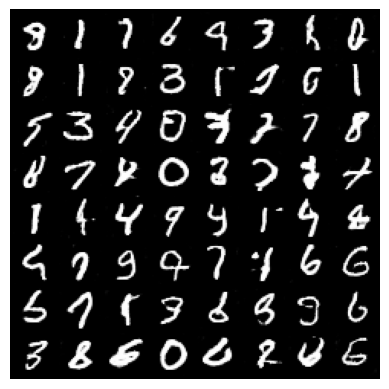

Epoch: 39


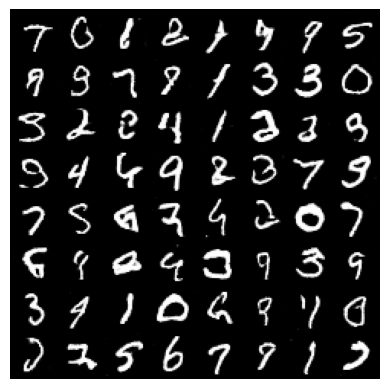

Epoch: 40


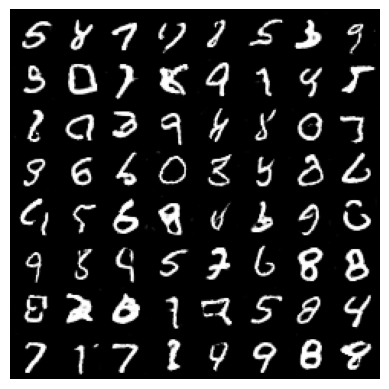

Epoch: 41


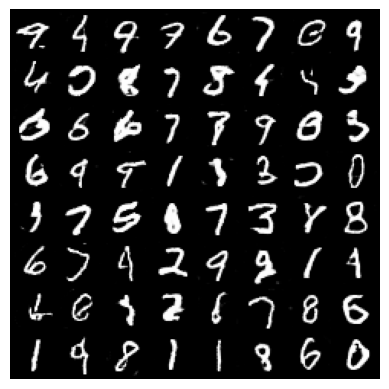

Epoch: 42


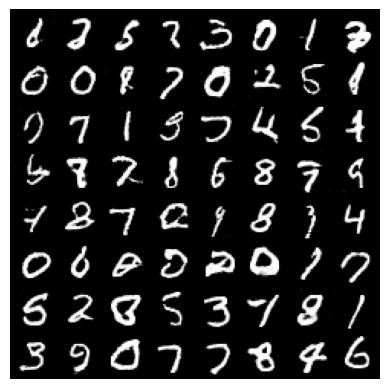

Epoch: 43


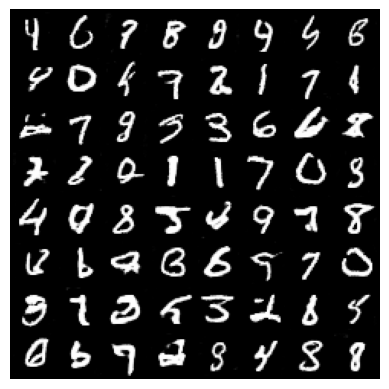

Epoch: 44


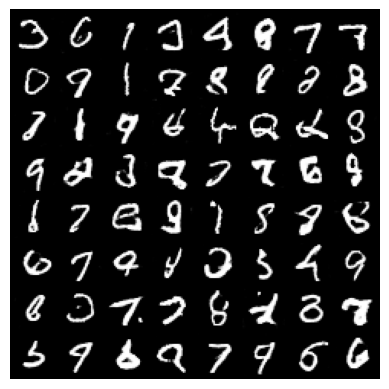

Epoch: 45


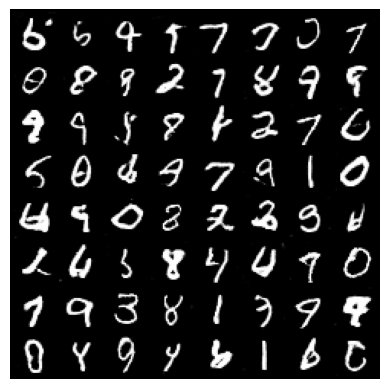

Epoch: 46


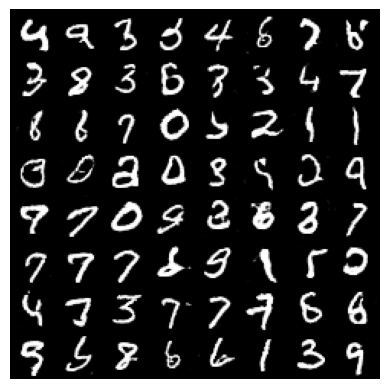

Epoch: 47


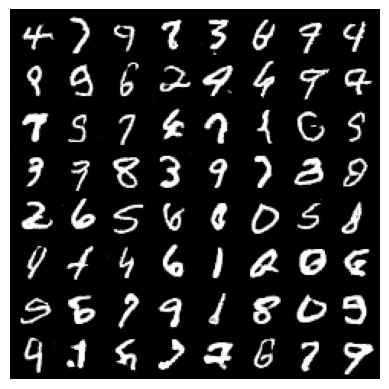

Epoch: 48


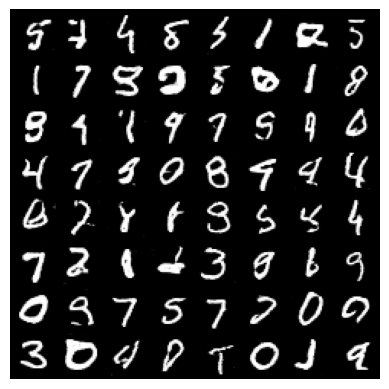

Epoch: 49


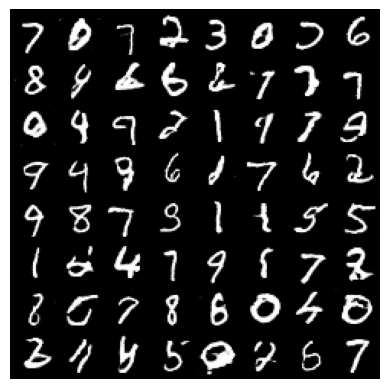

Epoch: 50


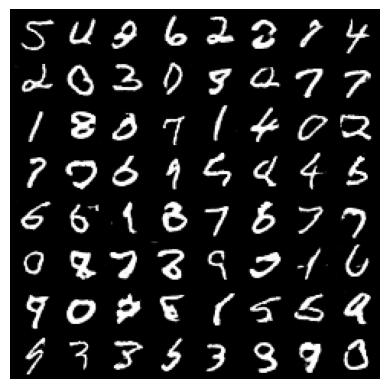

Epoch: 51


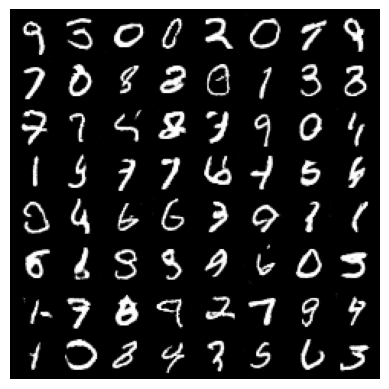

Epoch: 52


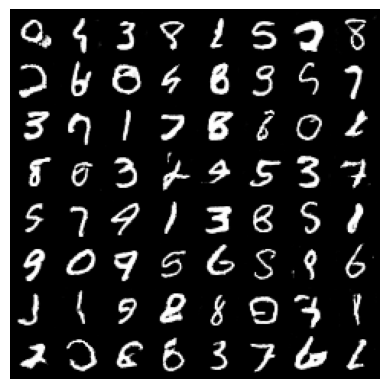

Epoch: 53


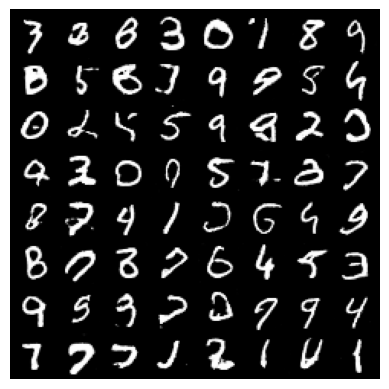

Epoch: 54


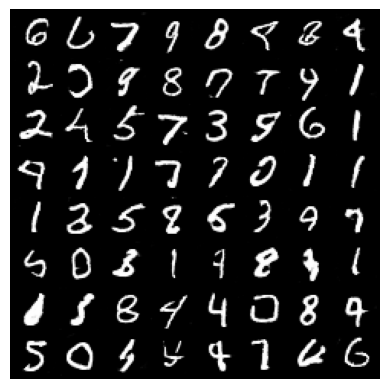

Epoch: 55


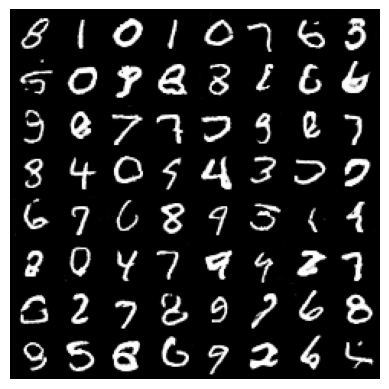

Epoch: 56


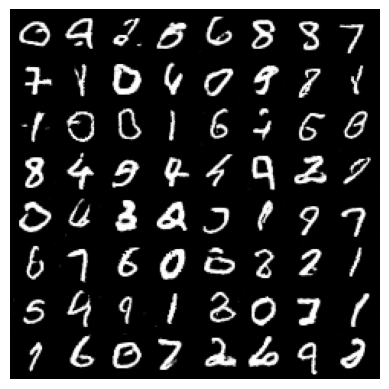

Epoch: 57


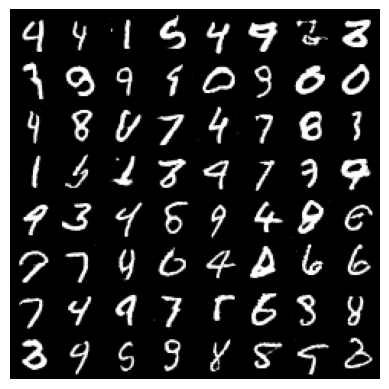

Epoch: 58


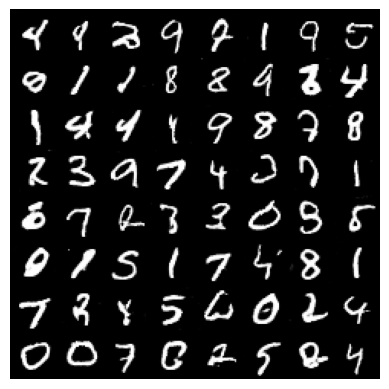

Epoch: 59


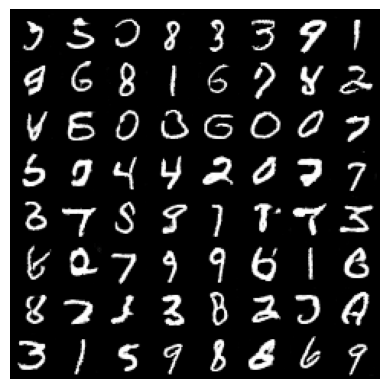

Epoch: 60


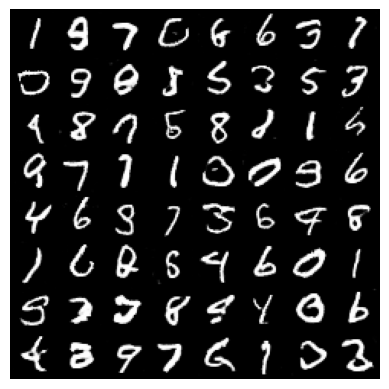

Epoch: 61


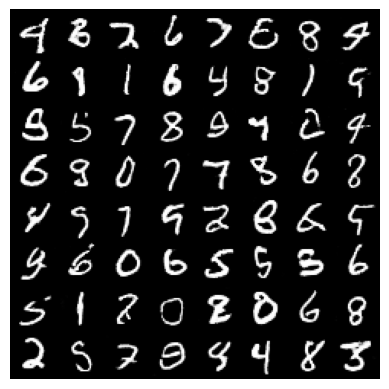

Epoch: 62


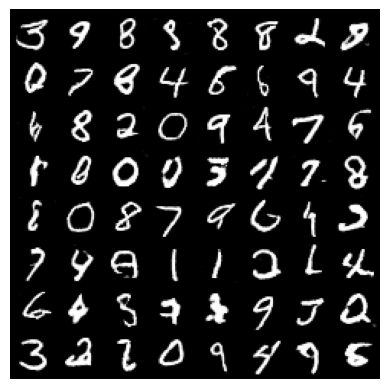

Epoch: 63


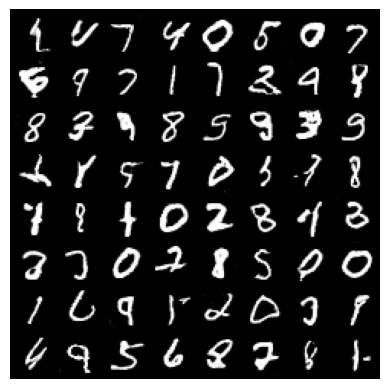

Epoch: 64


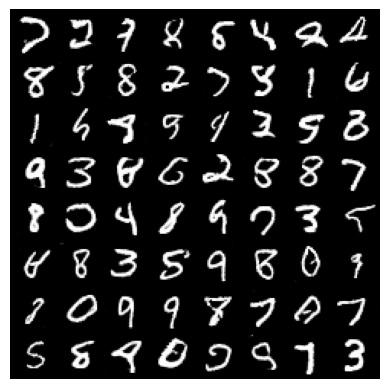

Epoch: 65


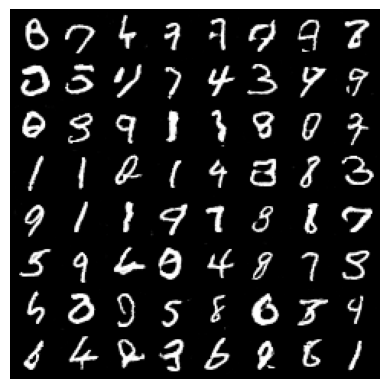

Epoch: 66


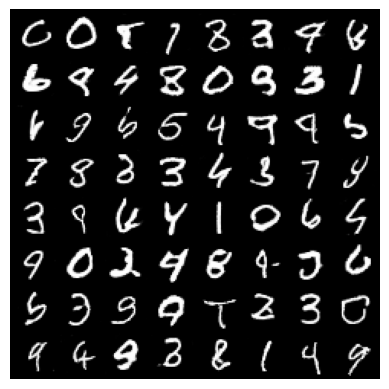

Epoch: 67


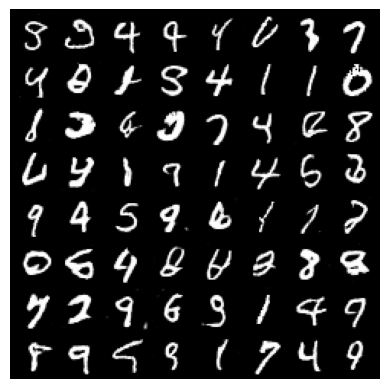

Epoch: 68


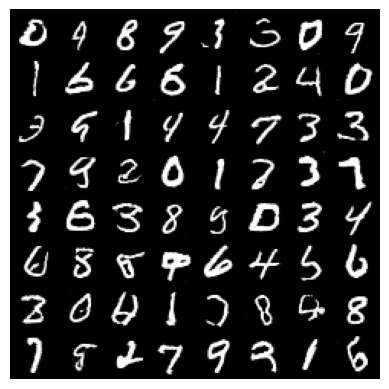

Epoch: 69


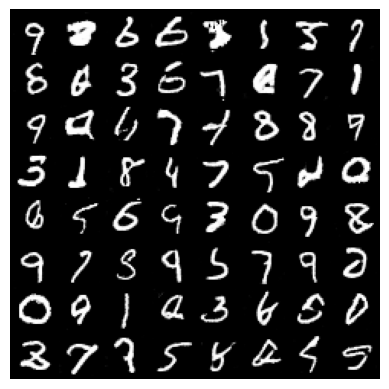

Epoch: 70


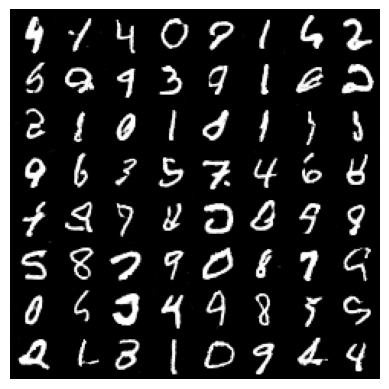

Epoch: 71


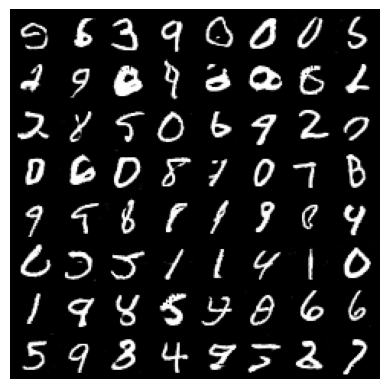

Epoch: 72


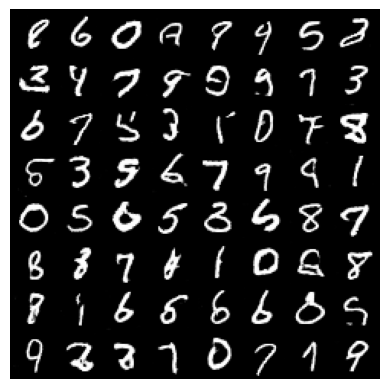

Epoch: 73


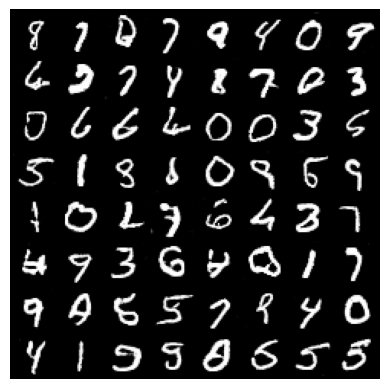

Epoch: 74


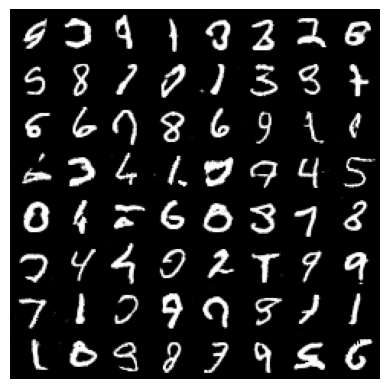

Epoch: 75


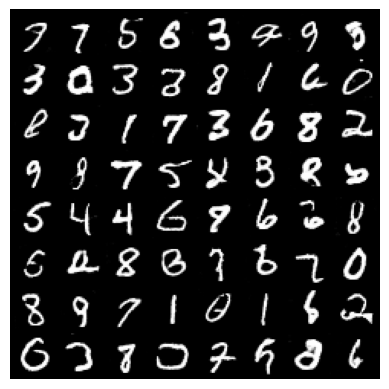

Epoch: 76


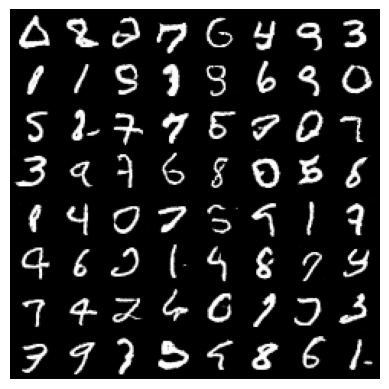

Epoch: 77


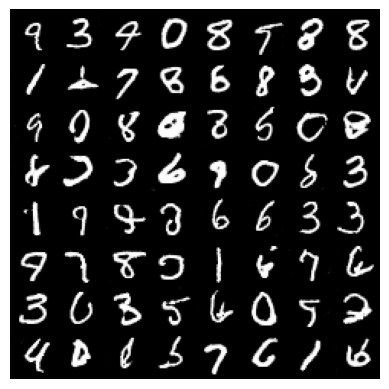

Epoch: 78


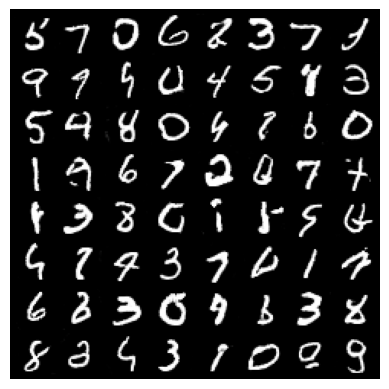

Epoch: 79


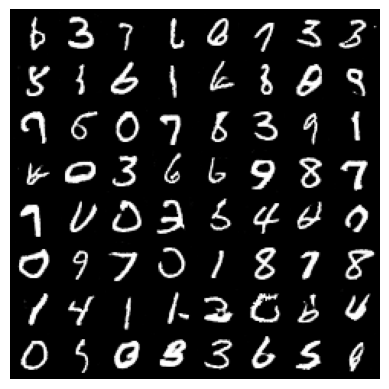

Epoch: 80


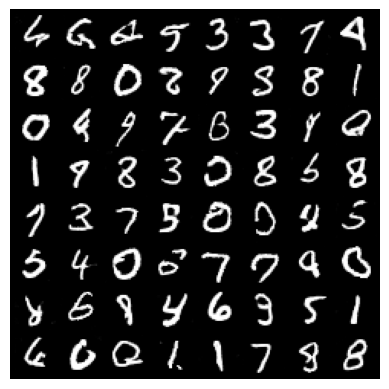

Epoch: 81


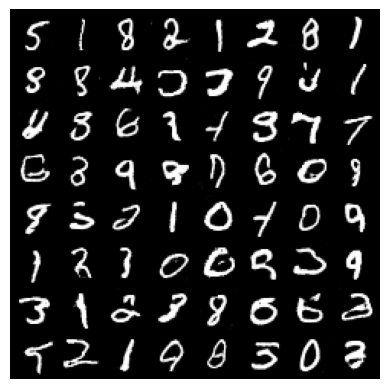

Epoch: 82


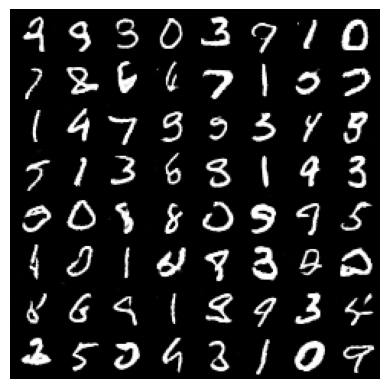

Epoch: 83


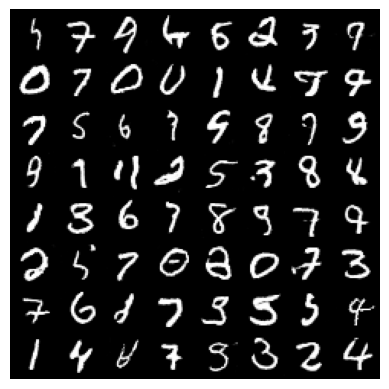

Epoch: 84


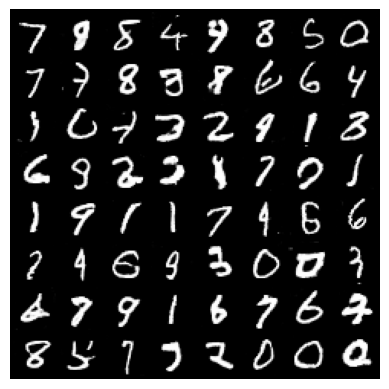

Epoch: 85


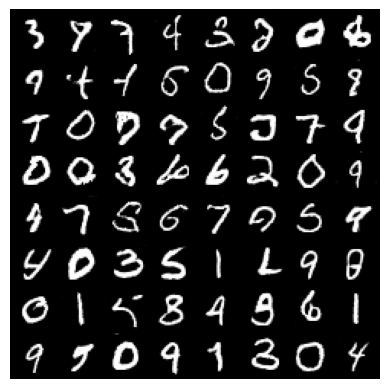

Epoch: 86


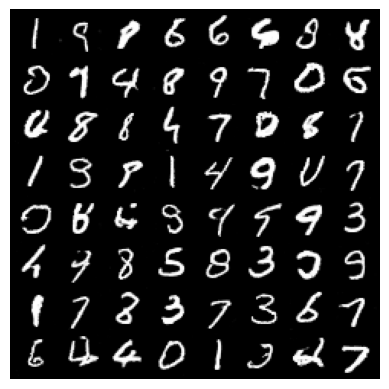

Epoch: 87


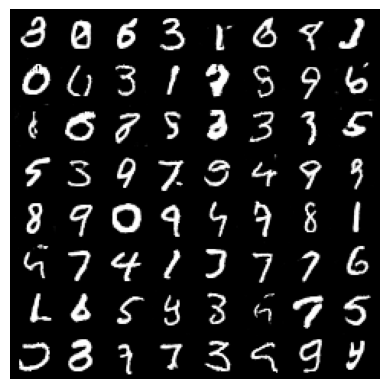

Epoch: 88


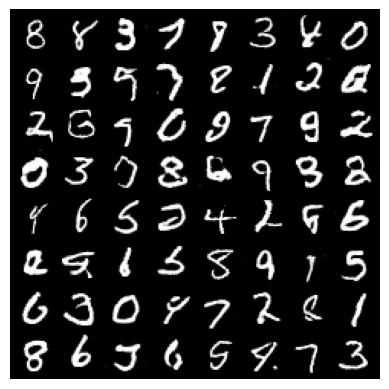

Epoch: 89


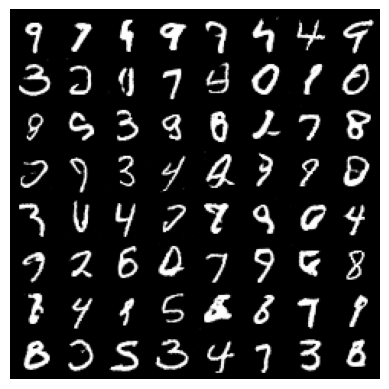

Epoch: 90


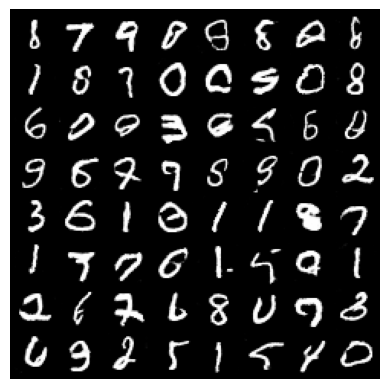

Epoch: 91


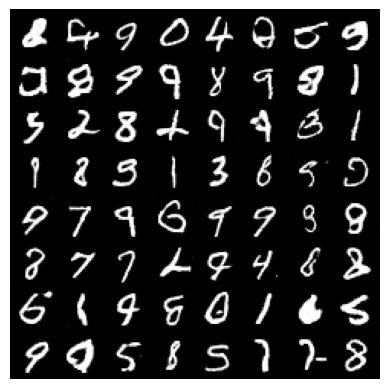

Epoch: 92


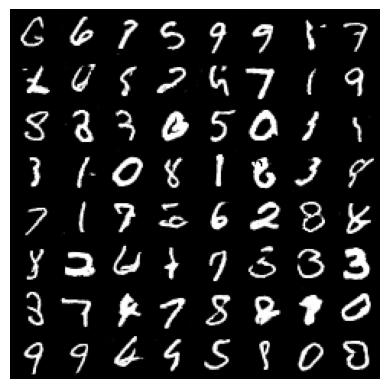

Epoch: 93


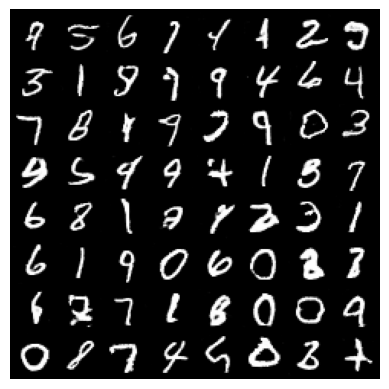

Epoch: 94


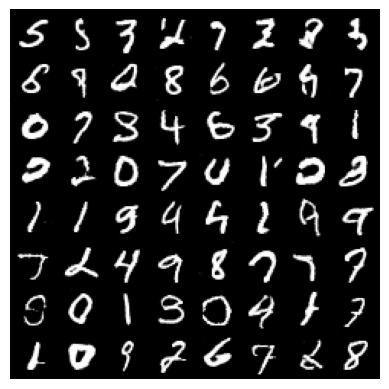

Epoch: 95


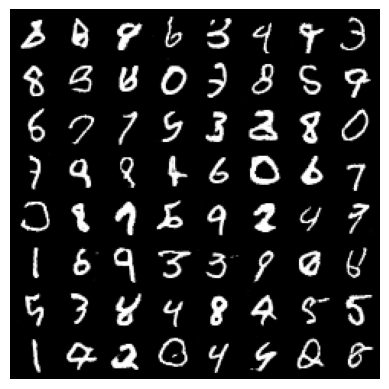

Epoch: 96


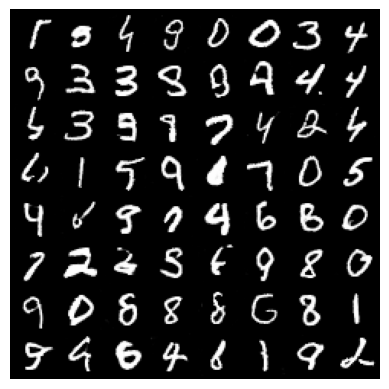

Epoch: 97


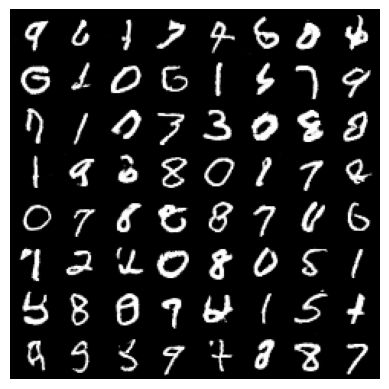

Epoch: 98


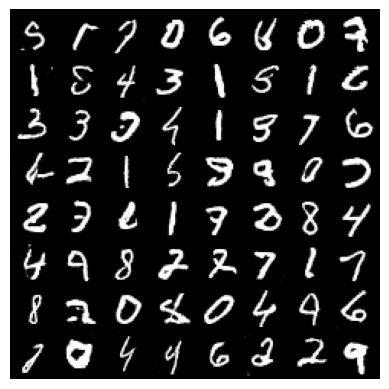

Epoch: 99


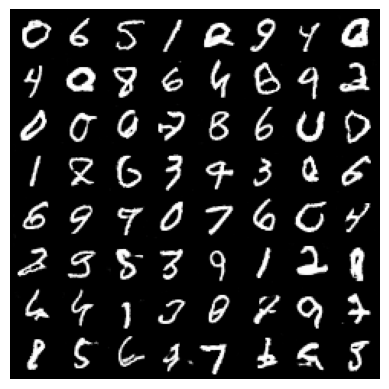

Epoch: 100


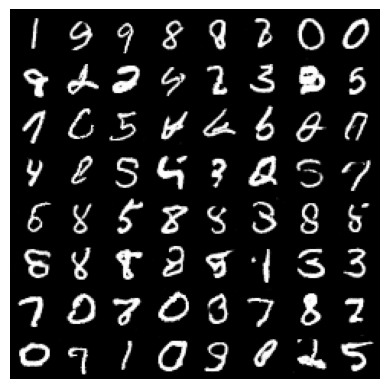

In [14]:
# Training loop
for epoch in range(num_epochs):
    for i, (real_images, _) in enumerate(data_loader):
        real_images = real_images.cuda()
        batch_size = real_images.size(0)

        # Train discriminator with real images
        optimizer_d.zero_grad()
        label_real = torch.ones(batch_size, 1).cuda()
        output_real = discriminator(real_images).view(-1, 1)
        loss_real = criterion(output_real, label_real)
        loss_real.backward()

        # Train discriminator with fake images
        noise = torch.randn(batch_size, latent_dim, 1, 1).cuda()
        fake_images = generator(noise)
        label_fake = torch.zeros(batch_size, 1).cuda()
        output_fake = discriminator(fake_images.detach()).view(-1, 1)
        loss_fake = criterion(output_fake, label_fake)
        loss_fake.backward()
        optimizer_d.step()

        # Train generator
        optimizer_g.zero_grad()
        output = discriminator(fake_images).view(-1, 1)
        loss_g = criterion(output, label_real)
        loss_g.backward()
        optimizer_g.step()

        # if (i + 1) % 900 == 0:
        #     print(f'Epoch [{epoch+1}/{num_epochs}], Batch [{i+1}/{len(data_loader)}], '
        #           f'D_real: {output_real.mean():.4f}, D_fake: {output_fake.mean():.4f}, '
        #           f'Loss_D: {loss_real.item() + loss_fake.item():.4f}, Loss_G: {loss_g.item():.4f}')
            # Generate and save sample images at the end of each epoch
    with torch.no_grad():
        print(f'Epoch: {epoch+1}')
        fake_samples = generator(torch.randn(64, latent_dim, 1, 1).cuda())
        fake_samples = fake_samples.cpu()
        fake_grid = torchvision.utils.make_grid(fake_samples, padding=2, normalize=True)
        plt.imshow(np.transpose(fake_grid, (1, 2, 0)))
        plt.axis('off')
        plt.show()